In [84]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import os
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)

from transformers import AutoModel
#model = AutoModel.from_pretrained("prajjwal1/bert-tiny", device_map="auto")


/home/ubuntu/mlops_IT_Support_Ticket_priority_model/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[transformers] PyTorch was not found. Models won't be available and only tokenizers, configuration and file/data utilities can be used.


In [4]:
s3_bucket_name = os.getenv('S3_BUCKET')
raw_data_path = "s3://mlops-project-bucket-602343785232-ap-southeast-1-an/raw_data/IT Support Ticket Data.csv"
print(raw_data_path)
raw_df = pd.read_csv(raw_data_path)

s3://mlops-project-bucket-602343785232-ap-southeast-1-an/raw_data/IT Support Ticket Data.csv


In [6]:
raw_df.head(5)

,Unnamed: 0,Body,Department,Priority,Tags
0,0,"Dear Customer Support Team,I am writing to rep...",Technical Support,high,"['Account', 'Disruption', 'Outage', 'IT', 'Tec..."
1,1,"Dear Customer Support Team,I hope this message...",Returns and Exchanges,medium,"['Product', 'Feature', 'Tech Support']"
2,2,"Dear Customer Support Team,I hope this message...",Billing and Payments,low,"['Billing', 'Payment', 'Account', 'Documentati..."
3,3,"Dear Support Team,I hope this message reaches ...",Sales and Pre-Sales,medium,"['Product', 'Feature', 'Feedback', 'Tech Suppo..."
4,4,"Dear Customer Support,I hope this message reac...",Technical Support,high,"['Feature', 'Product', 'Documentation', 'Feedb..."


In [7]:
sklearn_random_state = 42

### remove duplicate and null row

In [9]:
print(f"before: {len(raw_df):,}")

before: 29,651


In [10]:
raw_df.dropna(subset=["Body"],inplace=True)
raw_df.drop_duplicates(subset="Body",inplace=True)
raw_df.reset_index(drop=True,inplace=True)

In [11]:
print(f"after: {len(raw_df):,}")

after: 25,055


### train test split

In [32]:
train_ratio = 0.8
# this give tmp ratio as 0.2

# validation_ratio + test_ratio msut sum up to 1 but 

validation_ratio = 0.5 #50% of tmp ratio no train ratio
test_ratio = 0.5 #50% of tmp ratio no train ratio


selected_columns = ['Body','stratify_group','Priority','Department']


In [33]:
raw_df["stratify_group"] = raw_df["Department"] + "_" + raw_df["Priority"]

In [36]:
train_df

,Body,stratify_group,Priority,Department
3389,"Dear Customer Support,<br><br>The healthcare o...",Product Support_low,low,Product Support
15438,"Hello, inquiring about digital strategies to p...",Returns and Exchanges_low,low,Returns and Exchanges
10284,Requesting the implementation of real-time sta...,Service Outages and Maintenance_high,high,Service Outages and Maintenance
25044,"Dear Customer Support Team,I am reaching out t...",Product Support_high,high,Product Support
11771,"Hello Customer Support, I am inquiring about s...",Billing and Payments_medium,medium,Billing and Payments
...,...,...,...,...
5598,"Customer Support, I am writing to highlight th...",Customer Service_high,high,Customer Service
3653,The SaaS application becomes sluggish and unre...,Product Support_low,low,Product Support
8127,"Attention Customer Support, an unauthorized ac...",Technical Support_low,low,Technical Support
22798,I noticed some unanticipated fees on my bill.,Billing and Payments_low,low,Billing and Payments


In [38]:
validation_ratio

0.5

In [39]:
train_df, tmp_df = train_test_split(
    raw_df[selected_columns],
    train_size=train_ratio,
    random_state=42,
    stratify=raw_df["stratify_group"]
)

valid_df, test_df = train_test_split(
    tmp_df,
    test_size=validation_ratio,
    random_state=42,
    stratify=tmp_df["stratify_group"]
)

### verify target and department distribution

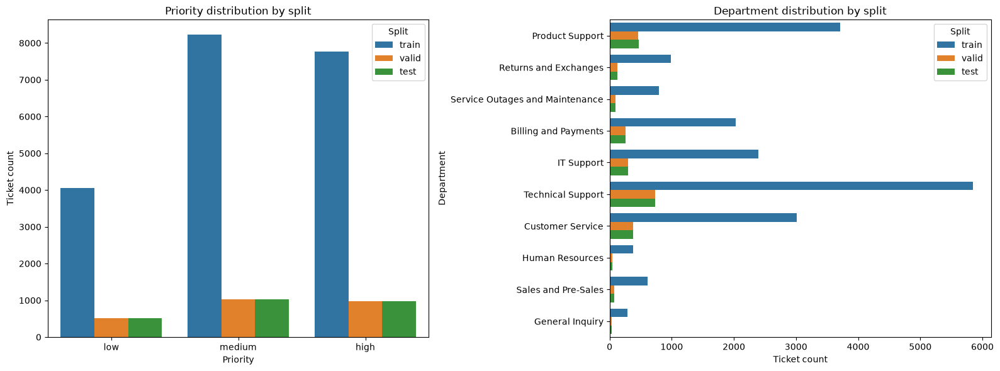

In [46]:
split_df = pd.concat([
    train_df.assign(Split="train"),
    valid_df.assign(Split="valid"),
    test_df.assign(Split="test")
])

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.countplot(data=split_df, x="Priority", hue="Split", order=["low", "medium", "high"], ax=axes[0])
axes[0].set_title("Priority distribution by split")
axes[0].set_xlabel("Priority")
axes[0].set_ylabel("Ticket count")

sns.countplot(data=split_df, y="Department", hue="Split", ax=axes[1])
axes[1].set_title("Department distribution by split")
axes[1].set_xlabel("Ticket count")
axes[1].set_ylabel("Department")

plt.tight_layout()
plt.show()


In [48]:
def split_ratio(column):
    return pd.concat([
        train_df[column].value_counts(normalize=True).mul(100).rename("train"),
        valid_df[column].value_counts(normalize=True).mul(100).rename("valid"),
        test_df[column].value_counts(normalize=True).mul(100).rename("test")
    ], axis=1).fillna(0).round(2)


priority_ratio = split_ratio("Priority")
department_ratio = split_ratio("Department")

priority_ratio, department_ratio


(          train  valid   test
 Priority                     
 medium    41.02  41.04  41.02
 high      38.78  38.76  38.79
 low       20.19  20.20  20.19,
                                  train  valid   test
 Department                                          
 Technical Support                29.16  29.14  29.17
 Product Support                  18.53  18.48  18.60
 Customer Service                 15.04  15.01  15.08
 IT Support                       11.95  11.94  11.93
 Billing and Payments             10.11  10.10  10.10
 Returns and Exchanges             4.93   4.91   4.95
 Service Outages and Maintenance   3.94   3.95   3.91
 Sales and Pre-Sales               3.04   3.07   2.99
 Human Resources                   1.89   1.92   1.88
 General Inquiry                   1.42   1.48   1.40)

In [52]:
train_df.head(1)

,Body,stratify_group,Priority,Department
3389,"Dear Customer Support,<br><br>The healthcare o...",Product Support_low,low,Product Support


### baseline tf idf + logistic regression

In [68]:
priority_map = {
    "low": 0,
    "medium": 1,
    "high": 2
}

X_train,Y_train = train_df['Body'],train_df['Priority'].map(priority_map)
X_valid,Y_valid = valid_df['Body'],valid_df['Priority'].map(priority_map)
X_test,Y_test = test_df['Body'],test_df['Priority'].map(priority_map)

In [71]:
model = Pipeline([
    ("tfidf", TfidfVectorizer(ngram_range=(1, 2))),
    ("clf", LogisticRegression(max_iter=1000, class_weight="balanced"))
])

In [72]:
model.fit(X_train,Y_train) # fit x and y

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('tfidf', ...), ('clf', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"classes_ classes_: ndarray of shape (n_classes,)The classes labels. Only exist if the last step of the pipeline is aclassifier.","ndarray[int64](3,)","[0,1,2]"
,"ngram_range ngram_range: tuple (min_n, max_n), default=(1, 1)The lower and upper boundary of the range of n-values for differentn-grams to be extracted. All values of n such that min_n <= n <= max_nwill be used. For example an ``ngram_range`` of ``(1, 1)`` means onlyunigrams, ``(1, 2)`` means unigrams and bigrams, and ``(2, 2)`` meansonly bigrams.Only applies if ``analyzer`` is not callable.","(1, ...)"
,"input input: {'filename', 'file', 'content'}, default='content'- If `'filename'`, the sequence passed as an argument to fit is expected to be a list of filenames that need reading to fetch the raw content to analyze.- If `'file'`, the sequence items must have a 'read' method (file-like object) that is called to fetch the bytes in memory.- If `'content'`, the input is expected to be a sequence of items that can be of type string or byte.",'content'
,"encoding encoding: str, default='utf-8'If bytes or files are given to analyze, this encoding is used todecode.",'utf-8'
,"decode_error decode_error: {'strict', 'ignore', 'replace'}, default='strict'Instruction on what to do if a byte sequence is given to analyze thatcontains characters not of the given `encoding`. By default, it is'strict', meaning that a UnicodeDecodeError will be raised. Othervalues are 'ignore' and 'replace'.",'strict'
,"strip_accents strip_accents: {'ascii', 'unicode'} or callable, default=NoneRemove accents and perform other character normalizationduring the preprocessing step.'ascii' is a fast method that only works on characters that havea direct ASCII mapping.'unicode' is a slightly slower method that works on any characters.None (default) means no character normalization is performed.Both 'ascii' and 'unicode' use NFKD normalization from:func:`unicodedata.normalize`.",None


### baseline eval

In [78]:
y_train_batch_prediction = model.predict(X_train)
y_valid_batch_prediction = model.predict(X_valid)
y_test_batch_prediction = model.predict(X_test)

In [77]:
print(classification_report(Y_train, y_train_batch_prediction))

              precision    recall  f1-score   support

           0       0.81      0.95      0.88      4047
           1       0.91      0.85      0.88      8223
           2       0.89      0.87      0.88      7774

    accuracy                           0.88     20044
   macro avg       0.87      0.89      0.88     20044
weighted avg       0.88      0.88      0.88     20044



In [80]:
print(classification_report(Y_valid, y_valid_batch_prediction))

              precision    recall  f1-score   support

           0       0.49      0.55      0.52       506
           1       0.64      0.63      0.63      1028
           2       0.67      0.64      0.65       971

    accuracy                           0.62      2505
   macro avg       0.60      0.61      0.60      2505
weighted avg       0.62      0.62      0.62      2505



In [82]:
print(classification_report(Y_test, y_test_batch_prediction))

              precision    recall  f1-score   support

           0       0.53      0.61      0.57       506
           1       0.66      0.63      0.65      1028
           2       0.69      0.67      0.68       972

    accuracy                           0.64      2506
   macro avg       0.63      0.64      0.63      2506
weighted avg       0.65      0.64      0.64      2506

